# COVID-19: current situation on May

來源: [https://www.kaggle.com/corochann/covid-19-current-situation-on-may/notebook](https://www.kaggle.com/corochann/covid-19-current-situation-on-may/notebook)

此筆記的資料集來源:

- [Johns Hopkins University github repository](https://github.com/CSSEGISandData/COVID-19)

主要重點:

1. [**綜觀全球疫情走勢**](#綜觀全球疫情走勢)
    - 以 `折線圖` 分析
2. [**分析各國確診與死亡人數變化**](#分析各國確診與死亡人數變化)
    - 以 `柱狀圖`、`顏色指標全球動態地圖`、`顏色指標折線圖`、`顏色指標熱圖` 分析
3. [**各國省分詳細資訊**](#各國省分詳細資訊)
    - 有多少國家提供精確的省分疫情資料
    - 以 `Dictionary` 分析
4. [**深入探討美國疫情**](#深入探討美國疫情)
    - 以 `表格`、`顏色指標美國動態地圖`、`顏色指標折線圖`、`顏色指標熱圖` 分析
5. [**分析歐洲疫情**](#分析歐洲疫情)
    - 以 `顏色指標歐洲動態地圖`、`顏色指標折線圖`、`顏色指標熱圖` 分析
6. [**分析亞洲疫情**](#分析亞洲疫情)
    - 額外把台灣加在裡面
    - 以 `顏色指標亞洲動態地圖`、`顏色指標折線圖`、`顏色指標熱圖` 分析
7. [**哪些國家目前沒有新增案例**](#哪些國家目前沒有新增案例)
    - 以 `表格`、`柱狀圖`、`顏色指標全球動態地圖`、`顏色指標熱圖` 分析
8. [**全球疫情何時趨緩**](#全球疫情何時趨緩)
    - 以 `顏色指標折線圖` 分析

### 安裝

    pip install -r requirements.txt

In [1]:
import gc
import os
from pathlib import Path
import random
import sys

from tqdm import tqdm
import numpy as np
import pandas as pd
import scipy as sp


import matplotlib.pyplot as plt
import seaborn as sns

from IPython.core.display import display, HTML

# --- plotly ---
from plotly import tools, subplots
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
import plotly.io as pio
pio.templates.default = "plotly_dark"

# --- models ---
from sklearn import preprocessing
from sklearn.model_selection import KFold
import lightgbm as lgb
import xgboost as xgb
import catboost as cb

# --- setup ---
pd.set_option('max_columns', 50)

### 載入資料

使用到的資料集: [COVID-19/csse_covid_19_data/csse_covid_19_time_series/](https://github.com/CSSEGISandData/COVID-19/tree/master/csse_covid_19_data/csse_covid_19_time_series)

- 全球
    - `confirmed_global_df` : dataframe，儲存從 2020/1/22 到 2020/5/30 各國確診人數

    - `deaths_global_df` : dataframe，儲存從 2020/1/22 到 2020/5/30 各國死亡人數

    - `recovered_global_df` : dataframe，儲存從 2020/1/22 到 2020/5/30 各國康復人數
- 美國
    - `confirmed_us_df` : dataframe，儲存從 2020/1/22 到 2020/5/30 美國確診人數
    
    - `deaths_us_df` : dataframe，儲存從 2020/1/22 到 2020/5/30 美國死亡人數

In [2]:
import requests

for filename in ['time_series_covid19_confirmed_global.csv',
                 'time_series_covid19_deaths_global.csv',
                 'time_series_covid19_recovered_global.csv',
                 'time_series_covid19_confirmed_US.csv',
                 'time_series_covid19_deaths_US.csv']:
    print(f'Downloading {filename}')
    url = f'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/{filename}'
    myfile = requests.get(url)
    open(filename, 'wb').write(myfile.content)

### 資料前處理

In [3]:
from datetime import datetime

def _convert_date_str(df):
    try:
        df.columns = list(df.columns[:4]) + [datetime.strptime(d, "%m/%d/%y").date().strftime("%Y-%m-%d") for d in df.columns[4:]]
    except:
        print('_convert_date_str failed with %y, try %Y')
        df.columns = list(df.columns[:4]) + [datetime.strptime(d, "%m/%d/%Y").date().strftime("%Y-%m-%d") for d in df.columns[4:]]


confirmed_global_df = pd.read_csv('time_series_covid19_confirmed_global.csv')
_convert_date_str(confirmed_global_df)

deaths_global_df = pd.read_csv('time_series_covid19_deaths_global.csv')
_convert_date_str(deaths_global_df)

recovered_global_df = pd.read_csv('time_series_covid19_recovered_global.csv')
_convert_date_str(recovered_global_df)

In [4]:
# Filter out problematic data points (The West Bank and Gaza had a negative value, cruise ships were associated with Canada, etc.)
removed_states = "Recovered|Grand Princess|Diamond Princess"
removed_countries = "US|The West Bank and Gaza"

confirmed_global_df.rename(columns={"Province/State": "Province_State", "Country/Region": "Country_Region"}, inplace=True)
deaths_global_df.rename(columns={"Province/State": "Province_State", "Country/Region": "Country_Region"}, inplace=True)
recovered_global_df.rename(columns={"Province/State": "Province_State", "Country/Region": "Country_Region"}, inplace=True)

confirmed_global_df = confirmed_global_df[~confirmed_global_df["Province_State"].replace(np.nan, "nan").str.match(removed_states)]
deaths_global_df    = deaths_global_df[~deaths_global_df["Province_State"].replace(np.nan, "nan").str.match(removed_states)]
recovered_global_df = recovered_global_df[~recovered_global_df["Province_State"].replace(np.nan, "nan").str.match(removed_states)]

confirmed_global_df = confirmed_global_df[~confirmed_global_df["Country_Region"].replace(np.nan, "nan").str.match(removed_countries)]
deaths_global_df    = deaths_global_df[~deaths_global_df["Country_Region"].replace(np.nan, "nan").str.match(removed_countries)]
recovered_global_df = recovered_global_df[~recovered_global_df["Country_Region"].replace(np.nan, "nan").str.match(removed_countries)]

In [5]:
confirmed_global_melt_df = confirmed_global_df.melt(
    id_vars=['Country_Region', 'Province_State', 'Lat', 'Long'], value_vars=confirmed_global_df.columns[4:], var_name='Date', value_name='ConfirmedCases')
deaths_global_melt_df = deaths_global_df.melt(
    id_vars=['Country_Region', 'Province_State', 'Lat', 'Long'], value_vars=confirmed_global_df.columns[4:], var_name='Date', value_name='Deaths')
recovered_global_melt_df = deaths_global_df.melt(
    id_vars=['Country_Region', 'Province_State', 'Lat', 'Long'], value_vars=confirmed_global_df.columns[4:], var_name='Date', value_name='Recovered')

In [6]:
train = confirmed_global_melt_df.merge(deaths_global_melt_df, on=['Country_Region', 'Province_State', 'Lat', 'Long', 'Date'])
train = train.merge(recovered_global_melt_df, on=['Country_Region', 'Province_State', 'Lat', 'Long', 'Date'])

In [7]:
# --- US ---
confirmed_us_df = pd.read_csv('time_series_covid19_confirmed_US.csv')
deaths_us_df = pd.read_csv('time_series_covid19_deaths_US.csv')

confirmed_us_df.drop(['UID', 'iso2', 'iso3', 'code3', 'FIPS', 'Admin2', 'Combined_Key'], inplace=True, axis=1)
deaths_us_df.drop(['UID', 'iso2', 'iso3', 'code3', 'FIPS', 'Admin2', 'Combined_Key', 'Population'], inplace=True, axis=1)

confirmed_us_df.rename({'Long_': 'Long'}, axis=1, inplace=True)
deaths_us_df.rename({'Long_': 'Long'}, axis=1, inplace=True)

_convert_date_str(confirmed_us_df)
_convert_date_str(deaths_us_df)

# clean
confirmed_us_df = confirmed_us_df[~confirmed_us_df.Province_State.str.match("Diamond Princess|Grand Princess|Recovered|Northern Mariana Islands|American Samoa")]
deaths_us_df = deaths_us_df[~deaths_us_df.Province_State.str.match("Diamond Princess|Grand Princess|Recovered|Northern Mariana Islands|American Samoa")]

# --- Aggregate by province state ---
#confirmed_us_df.groupby(['Country_Region', 'Province_State'])
confirmed_us_df = confirmed_us_df.groupby(['Country_Region', 'Province_State']).sum().reset_index()
deaths_us_df = deaths_us_df.groupby(['Country_Region', 'Province_State']).sum().reset_index()

# remove lat, long.
confirmed_us_df.drop(['Lat', 'Long'], inplace=True, axis=1)
deaths_us_df.drop(['Lat', 'Long'], inplace=True, axis=1)

confirmed_us_melt_df = confirmed_us_df.melt(
    id_vars=['Country_Region', 'Province_State'], value_vars=confirmed_us_df.columns[2:], var_name='Date', value_name='ConfirmedCases')
deaths_us_melt_df = deaths_us_df.melt(
    id_vars=['Country_Region', 'Province_State'], value_vars=deaths_us_df.columns[2:], var_name='Date', value_name='Deaths')

train_us = confirmed_us_melt_df.merge(deaths_us_melt_df, on=['Country_Region', 'Province_State', 'Date'])

In [8]:
train = pd.concat([train, train_us], axis=0, sort=False)

train_us.rename({'Country_Region': 'country', 'Province_State': 'province', 'Date': 'date', 'ConfirmedCases': 'confirmed', 'Deaths': 'fatalities'}, axis=1, inplace=True)
train_us['country_province'] = train_us['country'].fillna('') + '/' + train_us['province'].fillna('')

In [9]:
train

,Country_Region,Province_State,Lat,Long,Date,ConfirmedCases,Deaths,Recovered
0,Afghanistan,NaN,33.0000,65.0000,2020-01-22,0,0,0.0
1,Albania,NaN,41.1533,20.1683,2020-01-22,0,0,0.0
2,Algeria,NaN,28.0339,1.6596,2020-01-22,0,0,0.0
3,Andorra,NaN,42.5063,1.5218,2020-01-22,0,0,0.0
4,Angola,NaN,-11.2027,17.8739,2020-01-22,0,0,0.0
...,...,...,...,...,...,...,...,...
7069,US,Virginia,NaN,NaN,2020-05-31,44607,1375,NaN
7070,US,Washington,NaN,NaN,2020-05-31,21702,1118,NaN
7071,US,West Virginia,NaN,NaN,2020-05-31,2010,75,NaN
7072,US,Wisconsin,NaN,NaN,2020-05-31,18403,592,NaN


In [10]:
train.rename({'Country_Region': 'country', 'Province_State': 'province', 'Id': 'id', 'Date': 'date', 'ConfirmedCases': 'confirmed', 'Deaths': 'fatalities', 'Recovered': 'recovered'}, axis=1, inplace=True)
train['country_province'] = train['country'].fillna('') + '/' + train['province'].fillna('')

# test.rename({'Country_Region': 'country', 'Province_State': 'province', 'Id': 'id', 'Date': 'date', 'ConfirmedCases': 'confirmed', 'Fatalities': 'fatalities'}, axis=1, inplace=True)
# test['country_province'] = test['country'].fillna('') + '/' + test['province'].fillna('')

## 綜觀全球疫情走勢

觀察 `ww_df` 的各個屬性

In [11]:
ww_df = train.groupby('date')[['confirmed', 'fatalities']].sum().reset_index()
ww_df['new_case'] = ww_df['confirmed'] - ww_df['confirmed'].shift(1)
ww_df['growth_factor'] = ww_df['new_case'] / ww_df['new_case'].shift(1)
ww_df.tail()

,date,confirmed,fatalities,new_case,growth_factor
126,2020-05-27,5691602,355622,102164.0,1.080357
127,2020-05-28,5808758,360302,117156.0,1.146744
128,2020-05-29,5924087,364861,115329.0,0.984405
129,2020-05-30,6058829,369120,134742.0,1.168327
130,2020-05-31,6166758,372029,107929.0,0.801005


觀察 `ww_melt_df` 的各個屬性

In [12]:
ww_melt_df = pd.melt(ww_df, id_vars=['date'], value_vars=['confirmed', 'fatalities', 'new_case'])
ww_melt_df

,date,variable,value
0,2020-01-22,confirmed,555.0
1,2020-01-23,confirmed,654.0
2,2020-01-24,confirmed,941.0
3,2020-01-25,confirmed,1434.0
4,2020-01-26,confirmed,2118.0
...,...,...,...
388,2020-05-27,new_case,102164.0
389,2020-05-28,new_case,117156.0
390,2020-05-29,new_case,115329.0
391,2020-05-30,new_case,134742.0


### 全球確診/死亡案例 (折線圖)

- 2020/4/2 確診人數突破 1M，且死亡人數為 52K
- 2020/5/1 確診人數突破 3.3M，且死亡人數為 238K
- **好消息! 每日新增確診案例曲線從 2020/4/4 開始趨於平緩至今**

In [13]:
fig = px.line(ww_melt_df, x="date", y="value", color='variable', 
              title="Worldwide Confirmed/Death Cases Over Time")
fig.show()

### 全球確診/死亡案例 (折線圖) (取log)

- 比較 2020/3 初和 2020/3 底，確診案例成長率的上升速度略為增加

In [14]:
fig = px.line(ww_melt_df, x="date", y="value", color='variable',
              title="Worldwide Confirmed/Death Cases Over Time (Log scale)",
             log_y=True)
fig.show()

### 全球死亡率 (折線圖)

- 可以明顯看到，死亡率在 2020/5 開始下降

In [15]:
ww_df['mortality'] = ww_df['fatalities'] / ww_df['confirmed']

fig = px.line(ww_df, x="date", y="mortality", 
              title="Worldwide Mortality Rate Over Time")
fig.show()

### 全球新增確診案例成長因子 (折線圖)

- **公式: 每日新增確診案例 / 昨日新增確診案例**
    - 大於1: 確診案例增加
    - 小於1: 確診案例減少

In [16]:
fig = px.line(ww_df, x="date", y="growth_factor", 
              title="Worldwide Growth Factor Over Time")
fig.add_trace(go.Scatter(x=[ww_df['date'].min(), ww_df['date'].max()], y=[1., 1.], name='Growth factor=1.', line=dict(dash='dash', color=('rgb(255, 0, 0)'))))
fig.update_yaxes(range=[0., 5.])
fig.show()

## 分析各國確診與死亡人數變化

觀察 `country_df` 的各個屬性

In [17]:
country_df = train.groupby(['date', 'country'])[['confirmed', 'fatalities']].sum().reset_index()
country_df.tail()

,date,country,confirmed,fatalities
24623,2020-05-31,West Bank and Gaza,448,3
24624,2020-05-31,Western Sahara,9,1
24625,2020-05-31,Yemen,323,80
24626,2020-05-31,Zambia,1057,7
24627,2020-05-31,Zimbabwe,178,4


列出 dataset 中出現的國家

In [18]:
countries = country_df['country'].unique()
print(f'{len(countries)} countries are in dataset:\n{countries}')

188 countries are in dataset:
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia' 'Bosnia and Herzegovina'
 'Botswana' 'Brazil' 'Brunei' 'Bulgaria' 'Burkina Faso' 'Burma' 'Burundi'
 'Cabo Verde' 'Cambodia' 'Cameroon' 'Canada' 'Central African Republic'
 'Chad' 'Chile' 'China' 'Colombia' 'Comoros' 'Congo (Brazzaville)'
 'Congo (Kinshasa)' 'Costa Rica' "Cote d'Ivoire" 'Croatia' 'Cuba' 'Cyprus'
 'Czechia' 'Denmark' 'Diamond Princess' 'Djibouti' 'Dominica'
 'Dominican Republic' 'Ecuador' 'Egypt' 'El Salvador' 'Equatorial Guinea'
 'Eritrea' 'Estonia' 'Eswatini' 'Ethiopia' 'Fiji' 'Finland' 'France'
 'Gabon' 'Gambia' 'Georgia' 'Germany' 'Ghana' 'Greece' 'Grenada'
 'Guatemala' 'Guinea' 'Guinea-Bissau' 'Guyana' 'Haiti' 'Holy See'
 'Honduras' 'Hungary' 'Iceland' 'India' 'Indonesia' 'Iran' 'Iraq'
 'Ireland' 'Israel'

列出有多少國家位於何種確診案例的數量等級

In [19]:
target_date = country_df['date'].max()

print('Date: ', target_date)
for i in [1, 10, 100, 1000, 10000]:
    n_countries = len(country_df.query('(date == @target_date) & confirmed > @i'))
    print(f'{n_countries} countries have more than {i} confirmed cases')

Date:  2020-05-31
188 countries have more than 1 confirmed cases
184 countries have more than 10 confirmed cases
161 countries have more than 100 confirmed cases
114 countries have more than 1000 confirmed cases
53 countries have more than 10000 confirmed cases


以 `柱狀圖` 表示

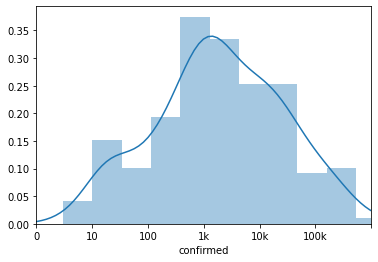

In [20]:
ax = sns.distplot(np.log10(country_df.query('date == @target_date')['confirmed'] + 1))
ax.set_xlim([0, 6])
ax.set_xticks(np.arange(7))
_ = ax.set_xticklabels(['0', '10', '100', '1k', '10k', '100k'])

觀察 `top_country_df` 的各個屬性

In [21]:
top_country_df = country_df.query('(date == @target_date) & (confirmed > 1000)').sort_values('confirmed', ascending=False)
top_country_df

,date,country,confirmed,fatalities
24614,2020-05-31,US,1789998,104376
24463,2020-05-31,Brazil,514849,29314
24580,2020-05-31,Russia,405843,4693
24618,2020-05-31,United Kingdom,276156,38571
24598,2020-05-31,Spain,239479,27127
...,...,...,...,...
24536,2020-05-31,Latvia,1066,24
24532,2020-05-31,Kosovo,1064,30
24626,2020-05-31,Zambia,1057,7
24481,2020-05-31,Costa Rica,1056,10


觀察 `top_country_melt_df` 的各個屬性

In [22]:
top_country_melt_df = pd.melt(top_country_df, id_vars='country', value_vars=['confirmed', 'fatalities'])
top_country_melt_df

,country,variable,value
0,US,confirmed,1789998
1,Brazil,confirmed,514849
2,Russia,confirmed,405843
3,United Kingdom,confirmed,276156
4,Spain,confirmed,239479
...,...,...,...
223,Latvia,fatalities,24
224,Kosovo,fatalities,30
225,Zambia,fatalities,7
226,Costa Rica,fatalities,10


### 目前各國確診/死亡案例 (柱狀圖)

In [23]:
fig = px.bar(top_country_melt_df.iloc[::-1],
             x='value', y='country', color='variable', barmode='group',
             title=f'Confirmed Cases/Deaths on {target_date}', text='value', height=1500, orientation='h')
fig.show()

### 目前確診案例前 30 國家 (折線圖)

In [24]:
top30_countries = top_country_df.sort_values('confirmed', ascending=False).iloc[:30]['country'].unique()
top30_countries_df = country_df[country_df['country'].isin(top30_countries)]
fig = px.line(top30_countries_df,
              x='date', y='confirmed', color='country',
              title=f'Confirmed Cases for top 30 country as of {target_date}')
fig.show()

### 目前死亡案例前 30 國家 (折線圖)

In [25]:
top30_countries = top_country_df.sort_values('fatalities', ascending=False).iloc[:30]['country'].unique()
top30_countries_df = country_df[country_df['country'].isin(top30_countries)]
fig = px.line(top30_countries_df,
              x='date', y='fatalities', color='country',
              title=f'Fatalities for top 30 country as of {target_date}')
fig.show()

觀察 `top_country_df` 的各個屬性
    - 確診案例條件判斷從 1000 改為 100
    - 新增死亡率欄位

In [26]:
top_country_df = country_df.query('(date == @target_date) & (confirmed > 100)')
top_country_df['mortality_rate'] = top_country_df['fatalities'] / top_country_df['confirmed']
top_country_df = top_country_df.sort_values('mortality_rate', ascending=False)
top_country_df

,date,country,confirmed,fatalities,mortality_rate
24625,2020-05-31,Yemen,323,80,0.247678
24456,2020-05-31,Belgium,58381,9467,0.162159
24502,2020-05-31,France,189009,28805,0.152400
24525,2020-05-31,Italy,232997,33415,0.143414
24618,2020-05-31,United Kingdom,276156,38571,0.139671
...,...,...,...,...,...
24592,2020-05-31,Singapore,34884,23,0.000659
24470,2020-05-31,Cambodia,125,0,0.000000
24622,2020-05-31,Vietnam,328,0,0.000000
24556,2020-05-31,Mongolia,179,0,0.000000


### 目前高死亡率前 30 國家 (柱狀圖)

In [27]:
fig = px.bar(top_country_df[:30].iloc[::-1],
             x='mortality_rate', y='country',
             title=f'Mortality rate HIGH: top 30 countries on {target_date}', text='mortality_rate', height=800, orientation='h')
fig.show()

### 目前低死亡率前 30 國家 (柱狀圖)

In [28]:
fig = px.bar(top_country_df[-30:],
             x='mortality_rate', y='country',
             title=f'Mortality rate LOW: top 30 countries on {target_date}', text='mortality_rate', height=800, orientation='h')
fig.show()

觀察 `all_country_df` 的各個屬性

In [29]:
all_country_df = country_df.query('date == @target_date')
all_country_df['confirmed_log1p'] = np.log10(all_country_df['confirmed'] + 1)
all_country_df['fatalities_log1p'] = np.log10(all_country_df['fatalities'] + 1)
all_country_df['mortality_rate'] = all_country_df['fatalities'] / all_country_df['confirmed']
all_country_df

,date,country,confirmed,fatalities,confirmed_log1p,fatalities_log1p,mortality_rate
24440,2020-05-31,Afghanistan,15205,257,4.182015,2.411620,0.016902
24441,2020-05-31,Albania,1137,33,3.056142,1.531479,0.029024
24442,2020-05-31,Algeria,9394,653,3.972897,2.815578,0.069512
24443,2020-05-31,Andorra,764,51,2.883661,1.716003,0.066754
24444,2020-05-31,Angola,86,4,1.939519,0.698970,0.046512
...,...,...,...,...,...,...,...
24623,2020-05-31,West Bank and Gaza,448,3,2.652246,0.602060,0.006696
24624,2020-05-31,Western Sahara,9,1,1.000000,0.301030,0.111111
24625,2020-05-31,Yemen,323,80,2.510545,1.908485,0.247678
24626,2020-05-31,Zambia,1057,7,3.024486,0.903090,0.006623


### 各國確診案例比較 (動態全球地圖) (以顏色區分等級)

- 顏色越深代表確診案例越多；反之則越少

In [30]:
fig = px.choropleth(all_country_df, locations="country", 
                    locationmode='country names', color="confirmed_log1p", 
                    hover_name="country", hover_data=["confirmed", 'fatalities', 'mortality_rate'],
                    range_color=[all_country_df['confirmed_log1p'].min(), all_country_df['confirmed_log1p'].max()], 
                    color_continuous_scale="peach", 
                    title='Countries with Confirmed Cases')

# I'd like to update colorbar to show raw values, but this does not work somehow...
# Please let me know if you know how to do this!!
trace1 = list(fig.select_traces())[0]
trace1.colorbar = go.choropleth.ColorBar(
    tickvals=[0, 1, 2, 3, 4, 5],
    ticktext=['1', '10', '100', '1000','10000', '10000'])
fig.show()

### 各國死亡案例比較 (動態全球地圖) (以顏色區分等級)

- 顏色越深代表死亡數越多；反之則越少

In [31]:
fig = px.choropleth(all_country_df, locations="country", 
                    locationmode='country names', color="fatalities_log1p", 
                    hover_name="country", range_color=[0, 4],
                    hover_data=['confirmed', 'fatalities', 'mortality_rate'],
                    color_continuous_scale="peach", 
                    title='Countries with fatalities')
fig.show()

### 各國死亡率比較 (動態全球地圖) (以顏色區分等級)

- 顏色越深代表死亡率越高；反之則越低

In [32]:
fig = px.choropleth(all_country_df, locations="country", 
                    locationmode='country names', color="mortality_rate", 
                    hover_name="country", range_color=[0, 0.12], 
                    color_continuous_scale="peach", 
                    title='Countries with mortality rate')
fig.show()

### 各國死亡案例 (折線圖) (取log) (超過 10 人死亡就開始記錄)

- 可以由這張圖比較各國的防疫能力 (醫療資源較充足、較早開始處理疫情的國家，曲線上升幅度會較緩慢)

In [33]:
n_countries = 20
n_start_death = 10
fatality_top_countires = top_country_df.sort_values('fatalities', ascending=False).iloc[:n_countries]['country'].values
country_df['date'] = pd.to_datetime(country_df['date'])


df_list = []
for country in fatality_top_countires:
    this_country_df = country_df.query('country == @country')
    start_date = this_country_df.query('fatalities > @n_start_death')['date'].min()
    this_country_df = this_country_df.query('date >= @start_date')
    this_country_df['date_since'] = this_country_df['date'] - start_date
    this_country_df['fatalities_log1p'] = np.log10(this_country_df['fatalities'] + 1)
    this_country_df['fatalities_log1p'] -= this_country_df['fatalities_log1p'].values[0]
    df_list.append(this_country_df)

tmpdf = pd.concat(df_list)
tmpdf['date_since_days'] = tmpdf['date_since'] / pd.Timedelta('1 days')

In [34]:
fig = px.line(tmpdf,
              x='date_since_days', y='fatalities_log1p', color='country',
              title=f'Fatalities by country since 10 deaths, as of {target_date}')
fig.add_trace(go.Scatter(x=[0, 28], y=[0, 4], name='Double by 7 days', line=dict(dash='dash', color=('rgb(200, 200, 200)'))))
fig.add_trace(go.Scatter(x=[0, 56], y=[0, 4], name='Double by 14 days', line=dict(dash='dash', color=('rgb(200, 200, 200)'))))
fig.add_trace(go.Scatter(x=[0, 84], y=[0, 4], name='Double by 21 days', line=dict(dash='dash', color=('rgb(200, 200, 200)'))))
fig.show()

### 各國每日新增確診案例 (折線圖)

In [35]:
country_df['prev_confirmed'] = country_df.groupby('country')['confirmed'].shift(1)
country_df['new_case'] = country_df['confirmed'] - country_df['prev_confirmed']
country_df['new_case'].fillna(0, inplace=True)
top30_country_df = country_df[country_df['country'].isin(top30_countries)]

fig = px.line(top30_country_df,
              x='date', y='new_case', color='country',
              title=f'DAILY NEW Confirmed cases by country')
fig.show()

### 各國新增確診案例成長因子 (折線圖)

- **公式: 每日新增確診案例 / 昨日新增確診案例**
    - 大於1: 確診案例增加
    - 小於1: 確診案例減少

In [36]:
country_df['prev_new_case'] = country_df.groupby('country')['new_case'].shift(1)
country_df['growth_factor'] = country_df['new_case'] / country_df['prev_new_case']
country_df['growth_factor'].fillna(0, inplace=True)
top30_country_df = country_df[country_df['country'].isin(top30_countries)]

fig = px.line(top30_country_df,
              x='date', y='growth_factor', color='country',
              title=f'Growth factor by country')
fig.add_trace(go.Scatter(x=[ww_df['date'].min(), ww_df['date'].max()], y=[1., 1.], name='Growth factor=1.', line=dict(dash='dash', color=('rgb(255, 0, 0)'))))
fig.update_yaxes(range=[0., 5.])
fig.show()

### 各國疫情發展情況: 確診案例 (點狀動態圖)

In [37]:
country_df['date'] = country_df['date'].apply(str)
country_df['confirmed_log1p'] = np.log1p(country_df['confirmed'])
country_df['fatalities_log1p'] = np.log1p(country_df['fatalities'])

fig = px.scatter_geo(country_df, locations="country", locationmode='country names', 
                     color="confirmed", size='confirmed', hover_name="country", 
                     hover_data=['confirmed', 'fatalities'],
                     range_color= [0, country_df['confirmed'].max()], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: Confirmed cases spread Over Time', color_continuous_scale="portland")
# fig.update(layout_coloraxis_showscale=False)
fig.show()

### 各國疫情發展情況: 死亡案例 (點狀動態圖)

In [38]:
fig = px.scatter_geo(country_df, locations="country", locationmode='country names', 
                     color="fatalities", size='fatalities', hover_name="country", 
                     hover_data=['confirmed', 'fatalities'],
                     range_color= [0, country_df['fatalities'].max()], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: Fatalities growth Over Time', color_continuous_scale="portland")
fig.show()

### 各國疫情發展情況: 每日新增確診案例 (點狀動態圖)

In [39]:
country_df.loc[country_df['new_case'] < 0, 'new_case'] = 0.
fig = px.scatter_geo(country_df, locations="country", locationmode='country names', 
                     color="new_case", size='new_case', hover_name="country", 
                     hover_data=['confirmed', 'fatalities'],
                     range_color= [0, country_df['new_case'].max()], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: Daily NEW cases over Time', color_continuous_scale="portland")
fig.show()

## 各國省分詳細資訊

提供詳細省分詳細資訊的僅有 8 個國家:
    - Australia, Canada, China, Denmark, France, Netherlands, US, UK

In [40]:
for country in countries:
    province = train.query('country == @country')['province'].unique()
    if len(province) > 1:       
        print(f'Country {country} has {len(province)} provinces: {province}')

Country Australia has 8 provinces: ['Australian Capital Territory' 'New South Wales' 'Northern Territory'
 'Queensland' 'South Australia' 'Tasmania' 'Victoria' 'Western Australia']
Country Canada has 12 provinces: ['Alberta' 'British Columbia' 'Manitoba' 'New Brunswick'
 'Newfoundland and Labrador' 'Nova Scotia' 'Ontario'
 'Prince Edward Island' 'Quebec' 'Saskatchewan' 'Northwest Territories'
 'Yukon']
Country China has 33 provinces: ['Anhui' 'Beijing' 'Chongqing' 'Fujian' 'Gansu' 'Guangdong' 'Guangxi'
 'Guizhou' 'Hainan' 'Hebei' 'Heilongjiang' 'Henan' 'Hong Kong' 'Hubei'
 'Hunan' 'Inner Mongolia' 'Jiangsu' 'Jiangxi' 'Jilin' 'Liaoning' 'Macau'
 'Ningxia' 'Qinghai' 'Shaanxi' 'Shandong' 'Shanghai' 'Shanxi' 'Sichuan'
 'Tianjin' 'Tibet' 'Xinjiang' 'Yunnan' 'Zhejiang']
Country Denmark has 3 provinces: ['Faroe Islands' 'Greenland' nan]
Country France has 11 provinces: ['French Guiana' 'French Polynesia' 'Guadeloupe' 'Mayotte' 'New Caledonia'
 'Reunion' 'Saint Barthelemy' 'St Martin' 'Martini

## 深入探討美國疫情

- 需要去 Kaggle 下載 data，但仔細看完發現其實這部分的分析不太需要，因為對美國州省的了解不是很通透，因此就僅放上連結:
    - [link](https://www.kaggle.com/corochann/covid-19-current-situation-on-may/data#Zoom-up-to-US:-what-is-happening-in-US-now??)

## 分析歐洲疫情

- 跟美國一樣，不需要此部分的分析，放上連結:
    - [link](https://www.kaggle.com/corochann/covid-19-current-situation-on-may/data#Europe)

## 分析亞洲疫情

In [41]:
country_df['date'] = pd.to_datetime(country_df['date'])

### 亞洲國家確診案例比較 (動態亞洲地圖) (以顏色區分等級)

- 顏色越偏紅確診病例越多，越偏藍越少

In [42]:
country_latest = country_df.query('date == @target_date')

fig = px.choropleth(country_latest, locations="country", 
                    locationmode='country names', color="confirmed", 
                    hover_name="country", range_color=[1, 50000], 
                    color_continuous_scale='portland', 
                    title=f'Asian Countries with Confirmed Cases as of {target_date}', scope='asia', height=800)
fig.show()

### 亞洲國家每日新增確診案例 (折線圖)

In [43]:
top_asian_country_df = country_df[country_df['country'].isin(['China', 'Indonesia', 'Iran', 'Japan', 'Korea, South', 'Malaysia', 'Philippines', 'Taiwan*'])]

fig = px.line(top_asian_country_df,
              x='date', y='new_case', color='country',
              title=f'DAILY NEW Confirmed cases Asia')
fig.show()

### 亞洲國家新增確診案例成長因子 (折線圖)

In [44]:
top_asian_country_df['prev_new_case'] = top_asian_country_df.groupby('country')['new_case'].shift(1)
top_asian_country_df['growth_factor'] = top_asian_country_df['new_case'] / top_asian_country_df['prev_new_case']
top_asian_country_df['growth_factor'].fillna(0, inplace=True)
fig = px.line(top_asian_country_df,
              x='date', y='growth_factor', color='country',
              title=f'Growth factor by country in Asia')
fig.add_trace(go.Scatter(x=[top_asian_country_df['date'].min(), top_asian_country_df['date'].max()], y=[1., 1.],
                         name='Growth factor=1.', line=dict(dash='dash', color=('rgb(255, 0, 0)'))))
fig.update_yaxes(range=[0., 5.])
fig.show()

## 哪些國家目前沒有新增案例

In [45]:
max_confirmed = country_df.groupby('country')['new_case'].max().reset_index()
country_latest = pd.merge(country_latest, max_confirmed.rename({'new_case': 'max_new_case'}, axis=1))
country_latest['new_case_peak_to_now_ratio'] = country_latest['new_case'] / country_latest['max_new_case']

In [46]:
recovering_country = country_latest.query('new_case_peak_to_now_ratio < 0.5')
major_recovering_country = recovering_country.query('confirmed > 100')

### 全球死亡率最低前 30 國家 (柱狀圖)

In [47]:
fig = px.bar(major_recovering_country.sort_values('new_case_peak_to_now_ratio', ascending=False),
             x='new_case_peak_to_now_ratio', y='country',
             title=f'Mortality rate LOW: top 30 countries on {target_date}', text='new_case_peak_to_now_ratio', height=1000, orientation='h')
fig.show()

### 全球新增確診案例峰值比較 (全球動態地圖) (以顏色區分等級)

- 顏色越黃，表示還沒到達峰頂，疫情還很嚴峻；顏色越藍，表示已過疫情高峰，疫情已趨緩

In [48]:
fig = px.choropleth(country_latest, locations="country", 
                    locationmode='country names', color="new_case_peak_to_now_ratio", 
                    hover_name="country", range_color=[0, 1], 
                    # color_continuous_scale="peach", 
                    hover_data=['confirmed', 'fatalities', 'new_case', 'max_new_case'],
                    title='Countries with new_case_peak_to_now_ratio')
fig.show()

## 全球疫情何時趨緩

In [49]:
def sigmoid(t, M, beta, alpha, offset=0):
    alpha += offset
    return M / (1 + np.exp(-beta * (t - alpha)))

def error(x, y, params):
    M, beta, alpha = params
    y_pred = sigmoid(x, M, beta, alpha)

    # apply weight, latest number is more important than past.
    weight = np.arange(len(y_pred)) ** 2
    loss_mse = np.mean((y_pred - y) ** 2 * weight)
    return loss_mse

def gen_random_color(min_value=0, max_value=256) -> str:
    """Generate random color for plotly"""
    r, g, b = np.random.randint(min_value, max_value, 3)
    return f'rgb({r},{g},{b})'

In [50]:
def fit_sigmoid(exclude_days=0):
    target_country_df_list = []
    pred_df_list = []
    for target_country in top30_countries:
        print('target_country', target_country)
        # --- Train ---
        target_country_df = country_df.query('country == @target_country')

        #train_start_date = target_country_df['date'].min()
        train_start_date = target_country_df.query('confirmed > 1000')['date'].min()
        train_end_date = pd.to_datetime(target_date) - pd.Timedelta(f'{exclude_days} days')
        target_date_df = target_country_df.query('(date >= @train_start_date) & (date <= @train_end_date)')
        if len(target_date_df) <= 7:
            print('WARNING: the data is not enough, use 7 more days...')
            train_start_date -= pd.Timedelta('7 days')
            target_date_df = target_country_df.query('(date >= @train_start_date) & (date <= @train_end_date)')

        confirmed = target_date_df['confirmed'].values
        x = np.arange(len(confirmed))

        lossfun = lambda params: error(x, confirmed, params)
        res = sp.optimize.minimize(lossfun, x0=[np.max(confirmed) * 5, 0.04, 2 * len(confirmed) / 3.], method='nelder-mead')
        M, beta, alpha = res.x
        # sigmoid_models[key] = (M, beta, alpha)
        # np.clip(sigmoid(list(range(len(data), len(data) + steps)), M, beta, alpha), 0, None).astype(int)

        # --- Pred ---
        pred_start_date = target_country_df['date'].min()
        pred_end_date = pd.to_datetime('2020-07-01')
        days = int((pred_end_date - pred_start_date) / pd.Timedelta('1 days'))
        # print('pred start', pred_start_date, 'end', pred_end_date, 'days', days)

        x = np.arange(days)
        offset = (train_start_date - pred_start_date) / pd.Timedelta('1 days')
        print('train_start_date', train_start_date, 'offset', offset, 'params', M, beta, alpha)
        y_pred = sigmoid(x, M, beta, alpha, offset=offset)
        # target_country_df['confirmed_pred'] = y_pred

        all_dates = [pred_start_date + np.timedelta64(x, 'D') for x in range(days)]
        pred_df = pd.DataFrame({
            'date': all_dates,
            'country': target_country,
            'confirmed_pred': y_pred,
        })

        target_country_df_list.append(target_country_df)
        pred_df_list.append(pred_df)
    return target_country_df_list, pred_df_list

In [51]:
def plot_sigmoid_fitting(target_country_df_list, pred_df_list, title=''):
    n_countries = len(top30_countries)

    # --- Plot ---
    fig = go.Figure()

    for i in range(n_countries):
        target_country = top30_countries[i]
        target_country_df = target_country_df_list[i]
        pred_df = pred_df_list[i]
        color = gen_random_color(min_value=20)
        # Prediction
        fig.add_trace(go.Scatter(
            x=pred_df['date'], y=pred_df['confirmed_pred'],
            name=f'{target_country}_pred',
            line=dict(color=color, dash='dash')
        ))

        # Ground truth
        fig.add_trace(go.Scatter(
            x=target_country_df['date'], y=target_country_df['confirmed'],
            mode='markers', name=f'{target_country}_actual',
            line=dict(color=color),
        ))
    fig.update_layout(
        title=title, xaxis_title='Date', yaxis_title='Confirmed cases')
    fig.show()

In [52]:
target_country_df_list, pred_df_list = fit_sigmoid(exclude_days=0)

target_country US
train_start_date 2020-03-11 00:00:00 offset 49.0 params 1992920.9225161923 0.06049012230740245 48.167527031454384
target_country United Kingdom
train_start_date 2020-03-14 00:00:00 offset 52.0 params 292930.92618761276 0.07326019733737843 41.84959974992604
target_country Italy
train_start_date 2020-02-29 00:00:00 offset 38.0 params 234093.75565679907 0.07589876487133912 34.43881771338035
target_country Brazil
train_start_date 2020-03-21 00:00:00 offset 59.0 params 1638921.4685153814 0.06838905205596049 82.50766667897598
target_country France
train_start_date 2020-03-08 00:00:00 offset 46.0 params 182822.42474286538 0.1227098304384277 30.93460080237158
target_country Spain
train_start_date 2020-03-09 00:00:00 offset 47.0 params 235512.66464448092 0.09614917217212263 25.50421511980415
target_country Mexico
train_start_date 2020-03-30 00:00:00 offset 68.0 params 195331.0105626955 0.06697069620703311 64.13643572330075
target_country Belgium
train_start_date 2020-03-16 00:

### Sigmoid Fitting

- 預測未來疫情趨勢

In [53]:
plot_sigmoid_fitting(target_country_df_list, pred_df_list, title='Sigmoid fitting with all latest data')

接著作者挑出確診數 500 以下且 Active Case 小於 Active Case 最大值的 67% 的國家，並將最大值及目前的值印出來

我把百分比也印出來了，然而沒什麼用

In [54]:
target_country_df_list, pred_df_list = fit_sigmoid(exclude_days=7)

target_country US
train_start_date 2020-03-11 00:00:00 offset 49.0 params 1840838.970179263 0.06773103822808682 45.26315956216478
target_country United Kingdom
train_start_date 2020-03-14 00:00:00 offset 52.0 params 285598.3113116239 0.07662156769330956 41.045972554552414
target_country Italy
train_start_date 2020-02-29 00:00:00 offset 38.0 params 232437.2821800907 0.07784208836778442 34.26385297177803
target_country Brazil
train_start_date 2020-03-21 00:00:00 offset 59.0 params 1578602.1401899587 0.06988183451520227 81.21745858838906
target_country France
train_start_date 2020-03-08 00:00:00 offset 46.0 params 180355.06793481694 0.13123623718807584 30.753450881956542
target_country Spain
train_start_date 2020-03-09 00:00:00 offset 47.0 params 232253.40434361587 0.10352620547492937 25.358300774912223
target_country Mexico
train_start_date 2020-03-30 00:00:00 offset 68.0 params 158653.12398488098 0.07114028676731915 59.0290759293409
target_country Belgium
train_start_date 2020-03-16 00:

### Sigmoid Fitting (沒有最近 7 日資料)

- 預測準確度較不佳

In [55]:
plot_sigmoid_fitting(target_country_df_list, pred_df_list, title='Sigmoid fitting without last 7days data')